In [1]:
import os

# os.environ["XFORMERS_DISABLED"] = "1"
import sys
from pathlib import Path

SCRIPT_DIR = Path(os.getcwd())  # Sets SCRIPT_DIR to the notebook's directory
print("SCRIPT_DIR:", SCRIPT_DIR)

# Add the neural_networks directory to sys.path for importing modules
sys.path.append(os.path.expanduser('~/projects/astroNNomy/src/astronnomy/training/'))
print("Updated sys.path:", sys.path)
from astronnomy.training.train_nn import *
from torchvision.transforms.functional import hflip
from torchvision.transforms import Resize
torch.set_float32_matmul_precision('high')
import copy
import matplotlib.pyplot as plt
import cv2
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler
os.environ["XFORMERS_DISABLED"] = "1"

SCRIPT_DIR: /gpfs/home2/larsve/projects/astroNNomy/tests
Updated sys.path: ['/sw/arch/RHEL9/EB_production/2024/software/Python/3.12.3-GCCcore-13.3.0/lib/python312.zip', '/sw/arch/RHEL9/EB_production/2024/software/Python/3.12.3-GCCcore-13.3.0/lib/python3.12', '/sw/arch/RHEL9/EB_production/2024/software/Python/3.12.3-GCCcore-13.3.0/lib/python3.12/lib-dynload', '', '/home/larsve/projects/lofar_venv/lib/python3.12/site-packages', '/home/larsve/projects/astroNNomy/src/astronnomy/training/']


In [2]:
from cortexchange.wdclient import init_downloader
import os

# Make sure to store these variables.
login = os.getenv("WD_LOGIN")
password = os.getenv("WD_PASSWORD")


init_downloader(
    url="https://researchdrive.surfsara.nl/public.php/webdav/",
    cache=f"{os.path.join(os.path.expanduser('~'), '.cache/cortexchange')}",
    login=login,
    password=password,
)


from cortexchange.architecture import get_architecture, Architecture

Attempting authorization
Attempting authorization


In [3]:
TransferLearning: type(Architecture) = get_architecture("surf/TransferLearning")
model = TransferLearning(device="cuda", model_name="surf/dino_big_lora_default_pos_november_09876")
model.model.eval()

/home/larsve/projects/lofar_venv/lib/python3.12/site-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: '2.0.2' (you have '2.0.0'). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
Using cache found in /home/larsve/.cache/torch/hub/facebookresearch_dinov2_main
/home/larsve/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/swiglu_ffn.py:45: UserWarning: xFormers is disabled (SwiGLU)
  warnings.warn("xFormers is disabled (SwiGLU)")
/home/larsve/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/swiglu_ffn.py:51: UserWarning: xFormers is not available (SwiGLU)
  warnings.warn("xFormers is not available (SwiGLU)")
/home/larsve/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/attention.py:29: UserWarning: xFormers is disabled (Attention)
  warnings.warn("xFormers is disabled (Attention)")
/home/larsve

768
Could not load optim due to 'ImagenetTransferLearning' object has no attribute 'classifier'; skipping.


In [4]:
print(model.args)

{'normalize': 1, 'batch_size': 32, 'use_compile': False, 'label_smoothing': 0.1, 'stochastic_smoothing': False, 'lift': 'stack', 'use_lora': True, 'rank': 32, 'alpha': 32.0, 'resize': 560, 'lr': 1e-05, 'dropout_p': 0.1, 'model_name': 'dinov2_vitb14_reg', 'dataset_mean': tensor([0.3555], device='cuda:0', dtype=torch.bfloat16), 'dataset_std': tensor([0.1465], device='cuda:0', dtype=torch.bfloat16)}


In [39]:
img_size = 560

USE_CACHED = True

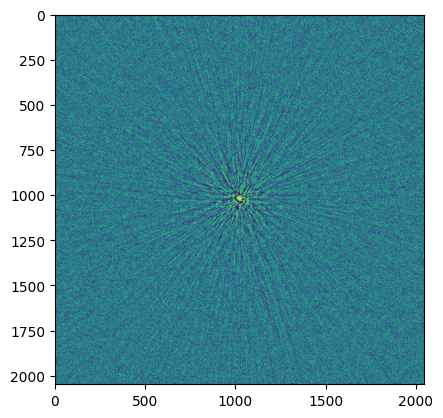

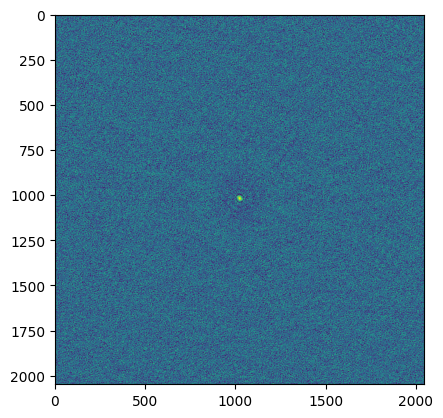

In [40]:
pointsource = {'first_continue': np.load('/scratch-shared/CORTEX/public.spider.surfsara.nl/lofarvwf/jdejong/CORTEX/calibrator_selection_robertjan/cnn_data/continue_val/P44832-000.npz')["arr_0"], 
'first_stop': np.load('/scratch-shared/CORTEX/public.spider.surfsara.nl/lofarvwf/jdejong/CORTEX/calibrator_selection_robertjan/cnn_data/stop_val/P44832-006.npz')["arr_0"]}
for key, img in pointsource.items():
    plt.imshow(img)
    plt.show()

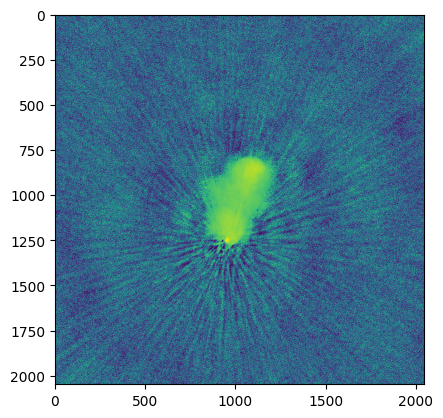

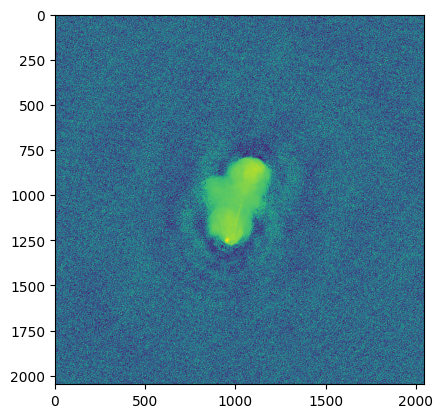

In [41]:
complex_source = {'first_continue': np.load('/scratch-shared/CORTEX/public.spider.surfsara.nl/lofarvwf/jdejong/CORTEX/calibrator_selection_robertjan/cnn_data/continue_val/P51372-000.npz')["arr_0"], 
'first_stop': np.load('/scratch-shared/CORTEX/public.spider.surfsara.nl/lofarvwf/jdejong/CORTEX/calibrator_selection_robertjan/cnn_data/stop_val/P51372-004.npz')["arr_0"]}
for key, img in complex_source.items():
    plt.imshow(img)
    plt.show()

In [42]:
img = model.prepare_batch(torch.tensor(np.stack(list(pointsource.values()) + list(complex_source.values()))).permute(0, 3, 1,2))

In [43]:
labels = [1, 0, 1, 0]

In [45]:
def PCA_pos(pos_embed, background_threshold=0.5, channels=3):
    pos_embed = pos_embed.cpu().squeeze()
    pca = PCA(n_components=channels)
    scaler = MinMaxScaler(clip=True)

    patches = pos_embed.shape[0]

    # First fit to seperate background and foreground
    pca.fit(pos_embed)
    pca_features = pca.transform(pos_embed)

    # MinMax Scaling
    scaler.fit(pca_features)
    pca_features = scaler.transform(pca_features)

    # Sometimes the predictions might come out slightly changed
    # you can play with the threshold to improve the outcome.
    pca_background = pca_features[:, 0] < background_threshold
    pca_foreground = ~pca_background

    # Second fit for the object
    pca.fit(pos_embed[pca_foreground])
    pca_features_rem = pca.transform(pos_embed[pca_foreground])

    scaler.fit(pca_features_rem)
    pca_features_rem = scaler.transform(pca_features_rem)


    # fig, axes = plt.subplots(1, np.ceil(channels / 3), figsize=(6 * len(img), 12))
    for color_start_idx in range(0, channels, 3):
        color_channels = channels - color_start_idx
        color_channels = 3 if channels > 1 else 1
        pca_features_rgb = np.zeros((patches, color_channels))
        pca_features_rgb[pca_background] = 0
        pca_features_rgb[pca_foreground, :color_channels] = pca_features_rem[:, color_start_idx:color_start_idx+color_channels]
        pca_features_rgb = pca_features_rgb.reshape(int(patches**0.5), int(patches**0.5), color_channels)
        plt.imshow(pca_features_rgb)
        plt.show()

In [75]:
def plot_PCA(img, model, label=None, background_threshold=0.5, channels=3):
    *_, h, w = img.shape
    patch_size = model.dino.encoder.patch_size
    h0, w0 = h // patch_size, w//patch_size
    patches = h0 * w0
    x = model.lift(img)
    n_images = len(img)
    features_dict = model.dino.encoder.forward_features(x)
    features = features_dict["x_norm_patchtokens"].detach().cpu().to(torch.float32).numpy()
    patch_features = features.reshape(n_images * patches, -1)
    preds = torch.nn.functional.sigmoid(model(img)).cpu().detach().to(torch.float32)
    pca = PCA(n_components=channels)
    scaler = MinMaxScaler(clip=True)
    if background_threshold is None:
        pca_foreground = np.ones(patch_features.shape[0]) == 1
        pca_background = np.zeros(patch_features.shape[0]) == 0
    else:
        # First fit to seperate background and foreground
        pca.fit(patch_features)
        pca_features = pca.transform(patch_features)

        # MinMax Scaling
        scaler.fit(pca_features)
        pca_features = scaler.transform(pca_features)

        # Sometimes the predictions might come out slightly changed
        # you can play with the threshold to improve the outcome.
        pca_background = pca_features[:, 0] < background_threshold
        pca_foreground = ~pca_background

    # Second fit for the object
    pca.fit(patch_features[pca_foreground])
    pca_features_rem = pca.transform(patch_features[pca_foreground])

    scaler.fit(pca_features_rem)
    pca_features_rem = scaler.transform(pca_features_rem)

    color_channels = 3 if channels > 1 else 1

    pca_features_rgb = np.zeros((n_images * patches, color_channels))
    pca_features_rgb[pca_background] = 0
    pca_features_rgb[pca_foreground, :channels] = pca_features_rem
    pca_features_rgb = pca_features_rgb.reshape(len(img), h0, w0, color_channels)

    fig, axes = plt.subplots(2, len(img), figsize=(6 * len(img), 12))
    for i in range(len(img)):
        axes[0, i].imshow(pca_features_rgb[i], cmap='magma')
        axes[0, i].set_title(f"PCA components, preds = {preds[i].item():.3f}, \n avg_components: {','.join([str(np.round(val, 2)) for val in np.mean(pca_features_rgb[i], axis=(0, 1))])}")
        # print(f"PCA components, preds = {preds[i].item():.3f}, \n avg_components: {','.join([str(np.round(val, 2)) for val in np.mean(pca_features_rgb[i], axis=(0, 1))])}")
        axes[0, i].axis("off")

        # Plot original images
        to_plot = (img.cpu()[i].movedim(0, 2) - img.cpu()[i].min()).to(torch.float32)
        axes[1, i].imshow(to_plot/to_plot.max(), cmap='gray')
        if label is not None:
            axes[1, i].set_title(f"{'continue' if label[i] else 'stop'}")
        axes[1, i].axis("off")

    plt.tight_layout()
    plt.show()

In [76]:
os.environ["XFORMERS_DISABLED"] = "1"

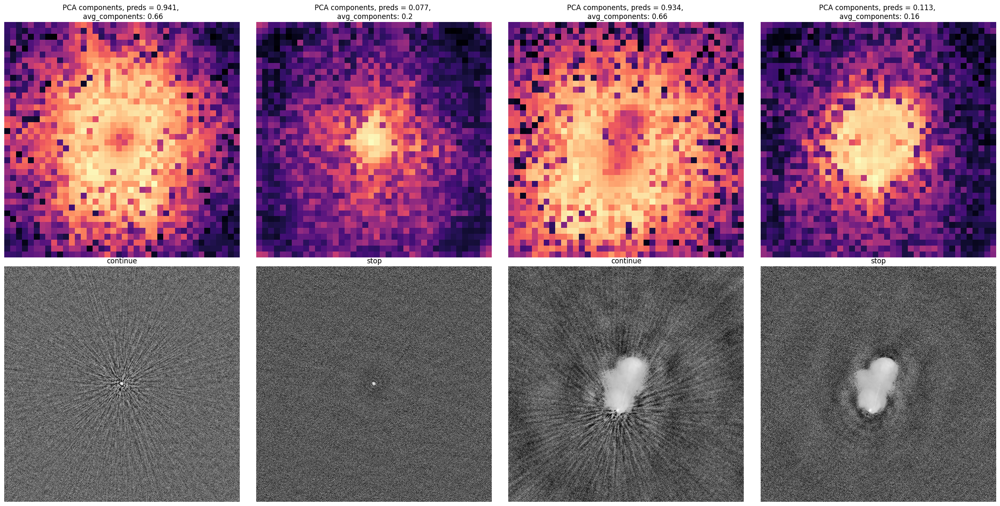

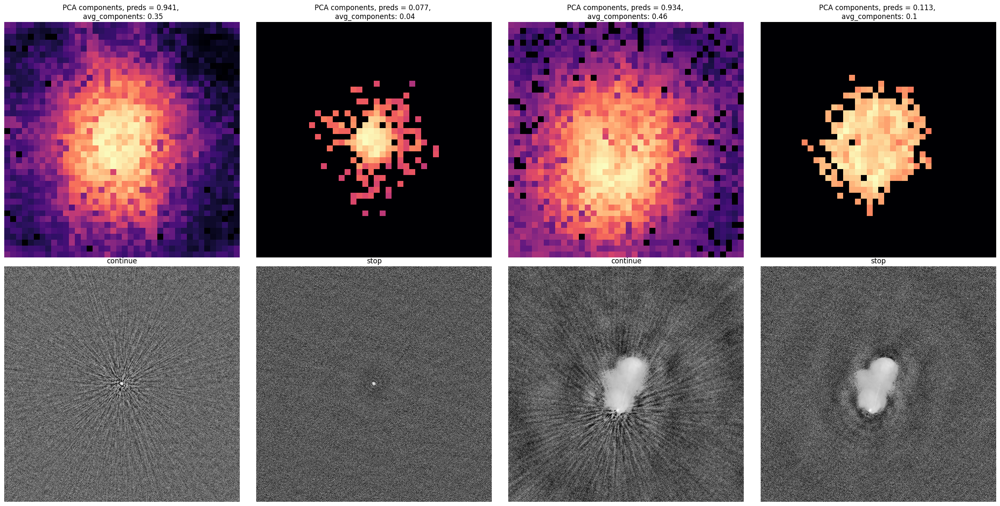

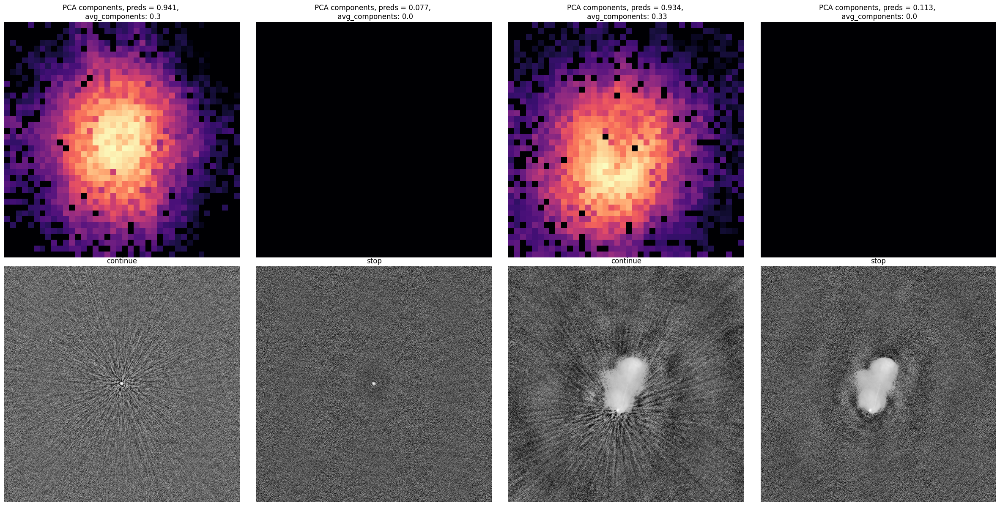

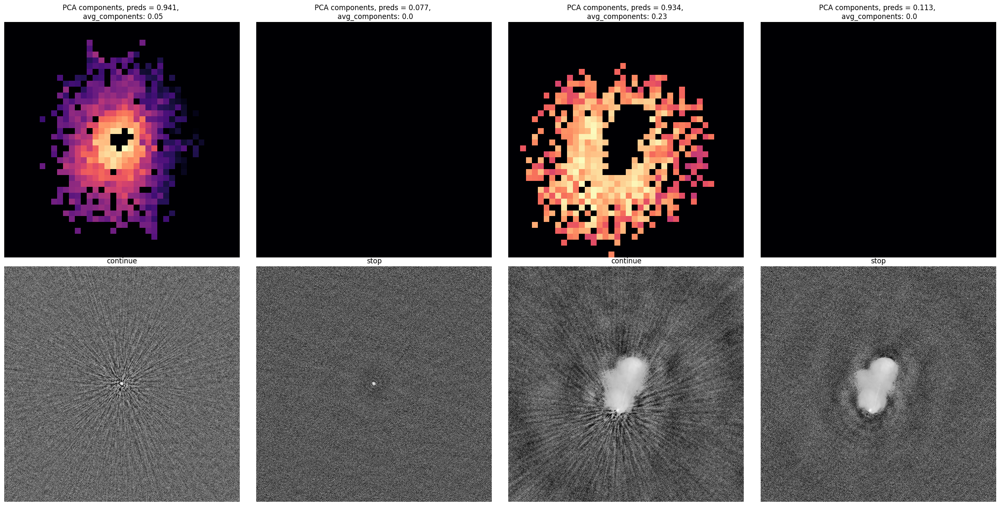

In [77]:
model.model.eval()
for param in model.model.parameters():
    param.requires_grad = False

# If background threshold is not None it will first attempt to remove the background (using PCA), and then only apply PCA for feature segmentation on the remaining patches. Otherwise it will skip this first step.
# With a higher value it will remove more "background".
plot_PCA(img.to(torch.bfloat16), model.model, label=labels, background_threshold=None, channels=1)
plot_PCA(img.to(torch.bfloat16), model.model, label=labels, background_threshold=0.3, channels=1)
plot_PCA(img.to(torch.bfloat16), model.model, label=labels, background_threshold=0.5, channels=1)
plot_PCA(img.to(torch.bfloat16), model.model, label=labels, background_threshold=0.8, channels=1)


